<font size="15"><center>**Predicting NBA Game Attendance**</center></font>

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Datasets" data-toc-modified-id="Datasets-1">Datasets</a></span><ul class="toc-item"><li><span><a href="#Load" data-toc-modified-id="Load-1.1">Load</a></span></li><li><span><a href="#Prepare" data-toc-modified-id="Prepare-1.2">Prepare</a></span></li></ul></li><li><span><a href="#Data-Exploration" data-toc-modified-id="Data-Exploration-2">Data Exploration</a></span><ul class="toc-item"><li><span><a href="#Visualizations" data-toc-modified-id="Visualizations-2.1">Visualizations</a></span></li><li><span><a href="#Baseline-models" data-toc-modified-id="Baseline-models-2.2">Baseline models</a></span></li></ul></li><li><span><a href="#Feature-selection" data-toc-modified-id="Feature-selection-3">Feature selection</a></span><ul class="toc-item"><li><span><a href="#Testing" data-toc-modified-id="Testing-3.1">Testing</a></span></li><li><span><a href="#Removal-of-indicated-features" data-toc-modified-id="Removal-of-indicated-features-3.2">Removal of indicated features</a></span></li><li><span><a href="#Decomposition" data-toc-modified-id="Decomposition-3.3">Decomposition</a></span></li></ul></li><li><span><a href="#Modeling" data-toc-modified-id="Modeling-4">Modeling</a></span><ul class="toc-item"><li><span><a href="#Clustering" data-toc-modified-id="Clustering-4.1">Clustering</a></span></li><li><span><a href="#Linear" data-toc-modified-id="Linear-4.2">Linear</a></span></li><li><span><a href="#Ensemble" data-toc-modified-id="Ensemble-4.3">Ensemble</a></span></li></ul></li></ul></div>

In [2]:
import src.display_in_jupyter as show
import src.models.ensemble as ensemble

# Datasets
---

## Load
<font size= 4> This data was originally scraped from multiple sources and includes game data since the 1998-1999 season.\
Three datasets have been created for use with numerous regression techniques applied to all:
- `dataset_1:` Game data since 1999
- `dataset_2:` Game data since 1999 with filtering to only include data of current stadium
- `dataset_3:` Game data since 2004 with filtering and popularity data included
    </font>

In [2]:
show.main_datasets()

### `Dataset 1:` 11 features: 5 numerical, 6 categorical, 1 response

,Curr Win %,LS Win %,Last Game,Last Attendance vs Opp,Capacity,Home,Visitor,Playoffs?,Last Five,Day of Week,Month,Attendance
Time,,,,,,,,,,,,
1999-02-05 00:00:00,0.00,0.703297,16566.0,11193.0,16795.0,Indiana Pacers,Washington Wizards,0,0.0,Friday,February,16621.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-30 20:00:00,0.85,0.700000,17525.0,16518.0,17732.0,Milwaukee Bucks,Charlotte Hornets,0,5.0,Saturday,November,17550.0


---

### `Dataset 2:` 11 features: 5 numerical, 6 categorical, 1 response

,Curr Win %,LS Win %,Last Game,Last Attendance vs Opp,Capacity,Home,Visitor,Playoffs?,Last Five,Day of Week,Month,Attendance
Time,,,,,,,,,,,,
1999-02-05 00:00:00,1.00,0.544118,18624.0,14890.0,18624.0,Boston Celtics,Toronto Raptors,0.0,1.0,Friday,February,17892.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-30 20:00:00,0.85,0.700000,17525.0,16518.0,17732.0,Milwaukee Bucks,Charlotte Hornets,0.0,5.0,Saturday,November,17550.0


---

### `Dataset 3:` 13 features: 7 numerical, 6 categorical, 1 response

,V Pop,H Pop,Curr Win %,LS Win %,Last Game,Last Attendance vs Opp,Capacity,Home,Visitor,Playoffs?,Last Five,Day of Week,Month,Attendance
Time,,,,,,,,,,,,,,
2004-01-02 19:00:00,3.0,3.0,0.333333,0.465753,13897.0,15108.0,20173.0,Washington Wizards,Golden State Warriors,0.0,1.0,Friday,January,12466.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-30 20:00:00,6.0,6.0,0.850000,0.700000,17525.0,16518.0,17732.0,Milwaukee Bucks,Charlotte Hornets,0.0,5.0,Saturday,November,17550.0


---

## Prepare 
<font size= 4> Create 80/20 train-test split － based off of smallest dataset － with most recent rows in the test set and one hot encode categorical features </font>

In [3]:
show.main_datasets_split()

### `Dataset 1 Training Set:` 87 features: 5 numerical, 82 categorical, 1 response

,Curr Win %,LS Win %,Last Game,Last Attendance vs Opp,Capacity,Playoffs?,Home_Atlanta Hawks,Home_Boston Celtics,Home_Brooklyn Nets,Home_Charlotte Hornets,...,Month_March,Month_May,Month_November,Month_October,Last Five_0.0,Last Five_1.0,Last Five_2.0,Last Five_3.0,Last Five_4.0,Last Five_5.0
Time,,,,,,,,,,,,,,,,,,,,,
1999-02-05 00:00:00,0.000000,0.703297,16566.0,11193.0,16795.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-04-21 19:00:00,0.505882,0.121951,21648.0,0.0,22807.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


---

### `Dataset 2 Training Set:` 87 features: 5 numerical, 82 categorical, 1 response

,Curr Win %,LS Win %,Last Game,Last Attendance vs Opp,Capacity,Playoffs?,Home_Atlanta Hawks,Home_Boston Celtics,Home_Brooklyn Nets,Home_Charlotte Hornets,...,Month_March,Month_May,Month_November,Month_October,Last Five_0.0,Last Five_1.0,Last Five_2.0,Last Five_3.0,Last Five_4.0,Last Five_5.0
Time,,,,,,,,,,,,,,,,,,,,,
1999-02-05 00:00:00,1.000000,0.544118,18624.0,14890.0,18624.0,0.0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-03-24 19:00:00,0.661972,0.584270,14278.0,24042.0,19639.0,0.0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0


---

### `Dataset 3 Training Set:` 89 features: 7 numerical, 82 categorical, 1 response

,V Pop,H Pop,Curr Win %,LS Win %,Last Game,Last Attendance vs Opp,Capacity,Playoffs?,Home_Atlanta Hawks,Home_Boston Celtics,...,Month_March,Month_May,Month_November,Month_October,Last Five_0.0,Last Five_1.0,Last Five_2.0,Last Five_3.0,Last Five_4.0,Last Five_5.0
Time,,,,,,,,,,,,,,,,,,,,,
2004-01-02 19:00:00,3.0,3.0,0.333333,0.465753,13897.0,15108.0,20173.0,0.0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-03-24 19:00:00,17.0,5.0,0.661972,0.584270,14278.0,24042.0,19639.0,0.0,0,0,...,1,0,0,0,0,0,0,1,0,0


---

# Data Exploration
---

## Visualizations
<font size=4> 
- Distributions of attendance outcomes for varying time intervals and features (bin size: 500 people)
- Heatmap of Pearson correlation coefficient (r) between numerical features
- Average attendance for varying time intervals and features 
</font>

In [4]:
show.plots()

### `Dataset 1:`

---

### `Dataset 2:`

---

### `Dataset 3:`

---

## Baseline models
<font size=4> Using the average of training attendance, $\overline{y}$, as a model results in the following scores: </font>

In [3]:
show.averages()

,$OSR^2$,Mean Absolute Error,Root Mean Square Error
Dataset 1 Average,0.0000,1642.0043,2017.8975
Dataset 2 Average,0.0000,1565.9919,1989.1569
Dataset 3 Average,0.0000,1549.0500,1986.2804


<font size=4>Ordinary Least Squares regression (OLS) is performed with the resulting scores:</font>

In [4]:
show.ols()

,$OSR^2$,Mean Absolute Error,Root Mean Square Error
Dataset 1 OLS,0.5474,1034.0210,1357.6231
Dataset 2 OLS,0.5452,1019.1399,1341.5297
Dataset 3 OLS,0.5479,1012.0256,1335.5951


# Feature selection 
---

## Testing
<font size=4> Testing is conducted with three metrics: 
- Variance Inflation Factor (VIF) with rounds conducted until all VIF scores are less than or equal to 5 
- F-test p-values
- Mutual Information
</font>

In [5]:
show.tests()

### `Dataset 1:`

,VIF Round 0,VIF Round 1,VIF Round 2,VIF Round 3,F-test (P-Value),Estimated Mutual Information
Capacity,57.7487,nan,nan,nan,0.0000,1.7417
Curr Win %,8.9050,8.7999,8.1534,6.2171,0.0000,0.0874
LS Win %,14.8666,14.5220,10.9315,nan,0.0000,1.3922
Last Attendance vs Opp,19.4374,16.2581,9.5548,6.2171,0.0000,0.6996
Last Game,51.9976,27.7840,nan,nan,0.0000,1.3450


### `Dataset 2:`

,VIF Round 0,VIF Round 1,VIF Round 2,VIF Round 3,F-test (P-Value),Estimated Mutual Information
Capacity,73.8233,nan,nan,nan,0.0000,1.6373
Curr Win %,8.8711,8.8062,8.1076,6.1476,0.0000,0.0916
LS Win %,15.0451,14.7384,10.8866,nan,0.0000,1.3386
Last Attendance vs Opp,19.7569,16.5714,9.4314,6.1476,0.0000,0.6782
Last Game,65.8662,29.6513,nan,nan,0.0000,1.2511


### `Dataset 3:`

,VIF Round 0,VIF Round 1,VIF Round 2,VIF Round 3,VIF Round 4,F-test (P-Value),Estimated Mutual Information
Capacity,82.1193,nan,nan,nan,nan,0.0000,1.7037
Curr Win %,8.7368,8.6950,8.0615,6.3843,nan,0.0000,0.1020
H Pop,1.9770,1.9180,1.8997,1.8774,1.8421,0.0000,0.4949
LS Win %,14.0478,13.9264,10.2635,nan,nan,0.0000,1.4093
Last Attendance vs Opp,19.3639,16.6392,9.0824,6.2187,2.1916,0.0000,0.7211
Last Game,80.0617,31.0291,nan,nan,nan,0.0000,1.3120
V Pop,1.7498,1.7473,1.7409,1.7400,1.6622,0.0000,0.0289


## Removal of indicated features

In [6]:
show.subsets()

### `Dataset 1 Subset 1` removed features:  LS Win %, Capacity, Last Game

### `Dataset 1 Subset 2` removed features:  Curr Win %, Last Attendance vs Opp

### `Dataset 2 Subset 1` removed features:  LS Win %, Last Game, Capacity

### `Dataset 2 Subset 2` removed features:  Curr Win %, Last Attendance vs Opp

### `Dataset 3 Subset 1` removed features:  Curr Win %, LS Win %, Last Game, Capacity

### `Dataset 3 Subset 2` removed features:  V Pop, Last Attendance vs Opp

### `Dataset 3 Subset 3` removed features:  V Pop, H Pop, Curr Win %, Last Attendance vs Opp

## Decomposition
<font size=4>Principal Component Analysis applied
- To evaluate if a reduction in feature dimensionality could be beneficial, OLS scores for the varying dimension reductions were compared to the baseline score
    - These values can be found in the accompying features/pca folder and were found to not improve the overall model for all datasets
</font>

# Modeling
---

## Clustering
<font size=4> K-Means clustering is performed and analyzed through a scree plot of the sum of squared distance between clusters versus number of clusters and silhouette plots with average silhouette score comparison
- This analysis resulted in the conclusion that K-Means clustering will not benefit the overall model</font>

### `Dataset 1:`

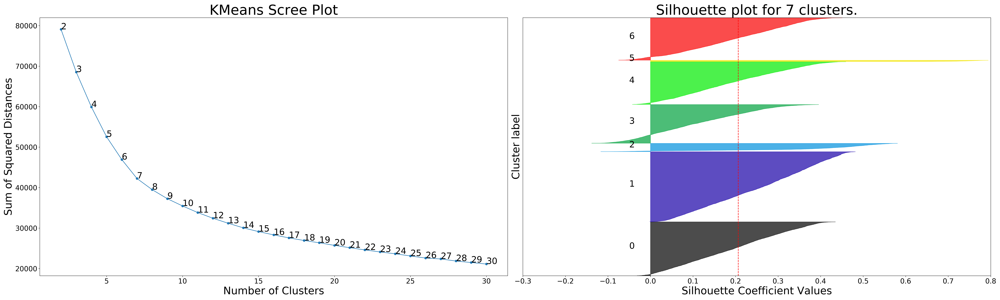

---

### `Dataset 2:`

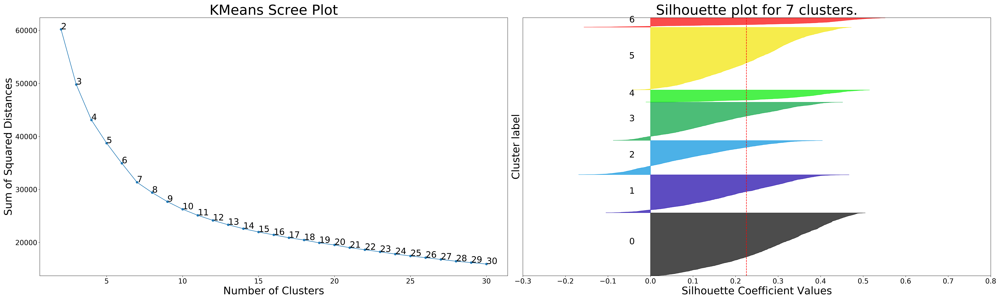

---

### `Dataset 3:`

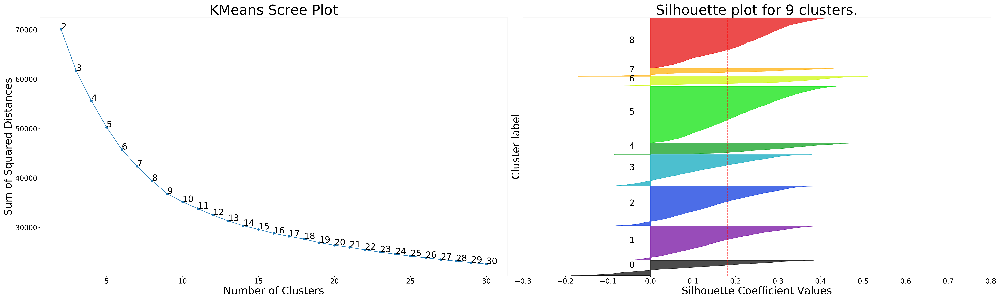

---

In [4]:
show.clustering()

## Linear
<font size=4> The following linear regression models are applied to the different datasets with best results found below:
- OLS
- Lasso
- Ridge
- Elastic Net
- Huber
- Support Vector 

For the models that required cross-validation (all models except OLS), two cross-validation methods are used: K-Fold (K = 5) and Time Series Split (5  Splits). \
The results of all models for all datasets can be found in the directory found at the path: 'models/linear'
</font>

In [7]:
show.linear()

### $OSR^2$: 0.5729: Dataset 3 Ridge

### Mean Absolute Error: 840.7326: Dataset 2 Huber

### Root Mean Square Error: 1298.1055: Dataset 3 Ridge

---

## Ensemble 
<font size=4> The following ensemble models are applied to the different datasets with best results for each method found below:
- Random Forest
- AdaBoost
- Gradient Boosting
- Extra Trees
    
Two cross-validation methods are used: K-Fold (K = 5) and Time Series Split (5 Splits).\
In order to speed up computing time for models with more than 50 different hyper-parameter combinations, a randomized search is implemented first and then a grid search over a subset of the original hyper-parameter considerations (except for Gradient Boosting where the randomized search was used only)\
The cross-validation results for the different models for all datasets can be found in the directory found at the path: 'models/cross_validation_outcomes/ensemble'\
The performance results of all models for all datasets with an overall comparison included can be found in the directory at the path: 'models/ensemble'
</font>

In [8]:
show.ensemble()

### $R^2$: 0.5871: Dataset 3 Gradient Boosting

### Mean Absolute Error: 849.4449: Dataset 3 Extra Trees

### Root Mean Square Error: 1275.9087: Dataset 3 Gradient Boosting

---